<!-- DON'T EDIT THIS CELL! -->
<!-- TYPE SHIFT+ENTER AND GO TO THE NEXT CELL -->

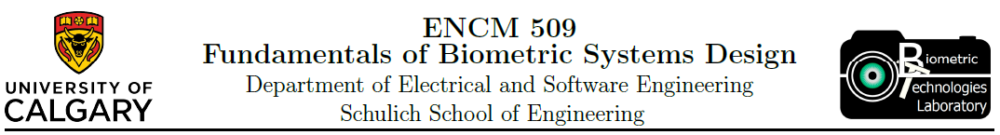

<center>
    <h1>Laboratory Experiment #8</h1>
    <h2>Bayesian Networks as a Machine Reasoning Tool</h2>
</center>


* Team member - Abid Al Labib 
    - UCID: 30070079
* Team member - Madhu Selvaraj
    - UCID: 30061979

## Introduction

In this lab we were introduced to Bayesian Networks. We were also introduced to PyAgrum and it was used to encode a Bayesian Network. As a part of this lab we manually calculated probabilites of different scenarios and compared it with the results of the PyAgrum calculations.

In [36]:
import os, random
import matplotlib.pyplot as plt
import pyAgrum as gum
import pyAgrum.lib.notebook as gnb
import numpy as np

%matplotlib inline

r_seed = 101

# for reproducibility
# must to run this before create the BN! 
# Even in the cases where were changed the states names
gum.initRandom(r_seed) 
random.seed(r_seed)

## Exercise 1

In [37]:
# fast create a BN (random paramaters are chosen)
bn1 = gum.fastBN('Winter->Influenza;' + 
                'Winter->Cold;' +
                'Influenza->Fever<-Cold')

bn1

(pyAgrum.BayesNet<double>@0x13c91677a50) BN{nodes: 4, arcs: 4, domainSize: 16, dim: 9, mem: 144o}

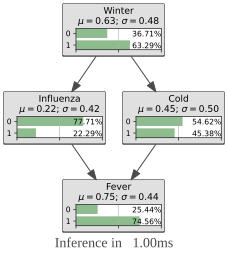

In [38]:
# Bayesian Network with random values
gnb.showInference(bn1)

### Populating the CPTs

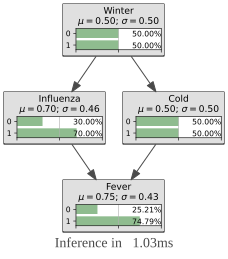

(pyAgrum.Potential<double>@0x13c9167ba10) 
             ||  Fever            |
Influe|Cold  ||0        |1        |
------|------||---------|---------|
0     |0     || 1.0000  | 0.0000  |
1     |0     || 0.1000  | 0.9000  |
0     |1     || 0.1000  | 0.9000  |
1     |1     || 0.0100  | 0.9900  |

In [39]:
bn1.cpt('Winter')[:] = [0.5, 0.5]

bn1.cpt('Cold')[{'Winter':0}] = [0.8, 0.2]
bn1.cpt('Cold')[{'Winter':1}] = [0.2, 0.8]

bn1.cpt('Influenza')[{'Winter':0}] = [0.5, 0.5]
bn1.cpt('Influenza')[{'Winter':1}] = [0.1, 0.9] # should be [0.1, 0.9]

bn1.cpt('Fever')[{'Influenza':0, 'Cold':0}] = [1.0, 0.0]
bn1.cpt('Fever')[{'Influenza':0, 'Cold':1}] = [0.1, 0.9]
bn1.cpt('Fever')[{'Influenza':1, 'Cold':0}] = [0.1, 0.9]
bn1.cpt('Fever')[{'Influenza':1, 'Cold':1}] = [0.01, 0.99]

# inference without evidences
gnb.showInference(bn1)
bn1.cpt('Fever')

### Inference in the network

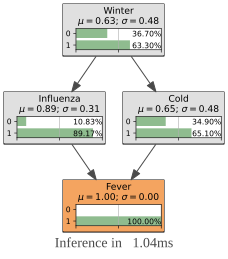

In [40]:
# set evidence that Fever is True 
evidence = {'Fever': True}

# in PyAgrum two algorithms are available to do inference:
# - Lazy Propagation (default): gum.LazyPropagation(bn)
# - Variable Elimination: gum.VariableElimination(bn)
gnb.showInference(bn1, evs=evidence, engine=gum.LazyPropagation(bn1))

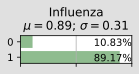

In [41]:
# calculate the updated value of prob. for Influenza
gnb.showPosterior(bn1, evidence, 'Influenza')

#### Other way to perform inferences

In [42]:
ie = gum.LazyPropagation(bn1)

ie.setEvidence(evidence)
ie.makeInference()

res_influenza = ie.posterior('Influenza')
res_influenza

(pyAgrum.Potential<double>@0x13c9167de30) 
  Influenza        |
0        |1        |
---------|---------|
 0.1083  | 0.8917  |

#### PyAgrum Calculation of P(Influenza = True | Fever = True)

In [43]:
# calculating the probability that somebody has Influenza considering that he/she already has Fever
print('P(Influenza = True | Fever = True): %.4f%%' % (res_influenza[1] * 100))

P(Influenza = True | Fever = True): 89.1697%


#### Manual Calculation

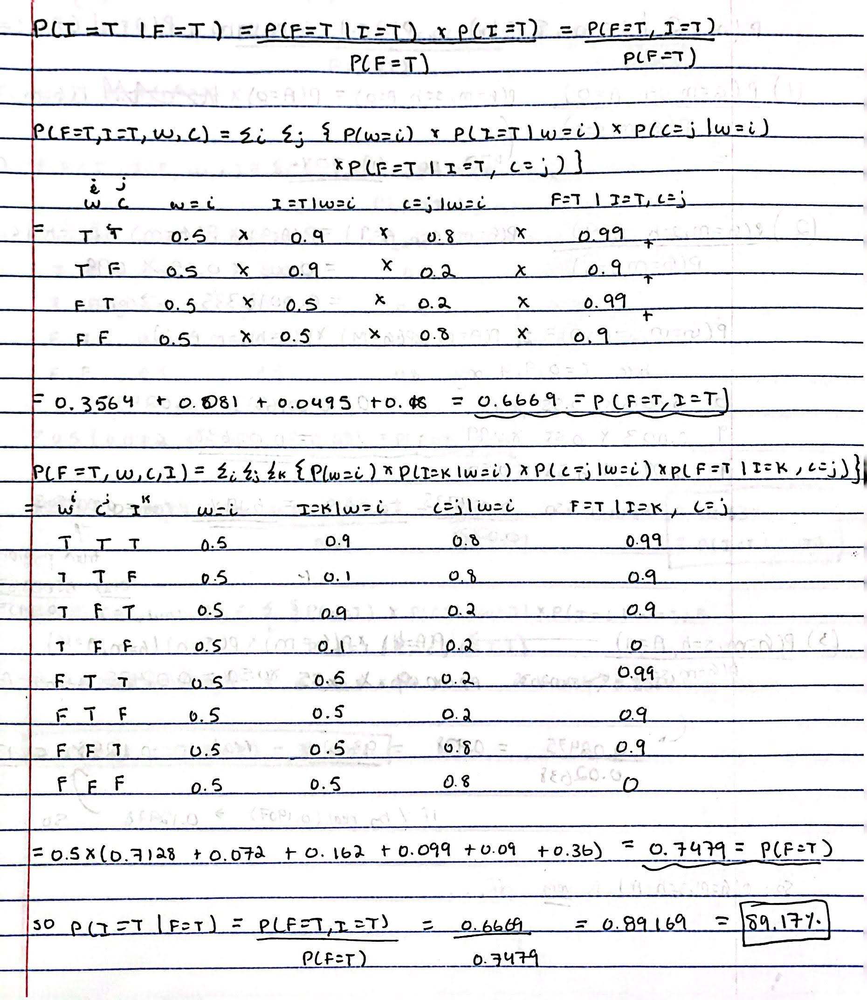

The probability of someone having influenza if they have a fever was calculuated to be 89.17% by both PyAgrum and our manual calculations. This makes sense as someone who has fever is more likely to have influenza than not. 

#### PyAgrum Calculation of P(Influenza = False | Fever = True)

In [44]:
# calculating the probability that somebody does not have Influenza considering that he/she already has Fever
print('P(Influenza = False | Fever = True): %.4f%%' % (res_influenza[0] * 100))

P(Influenza = False | Fever = True): 10.8303%


#### Manual Calculation

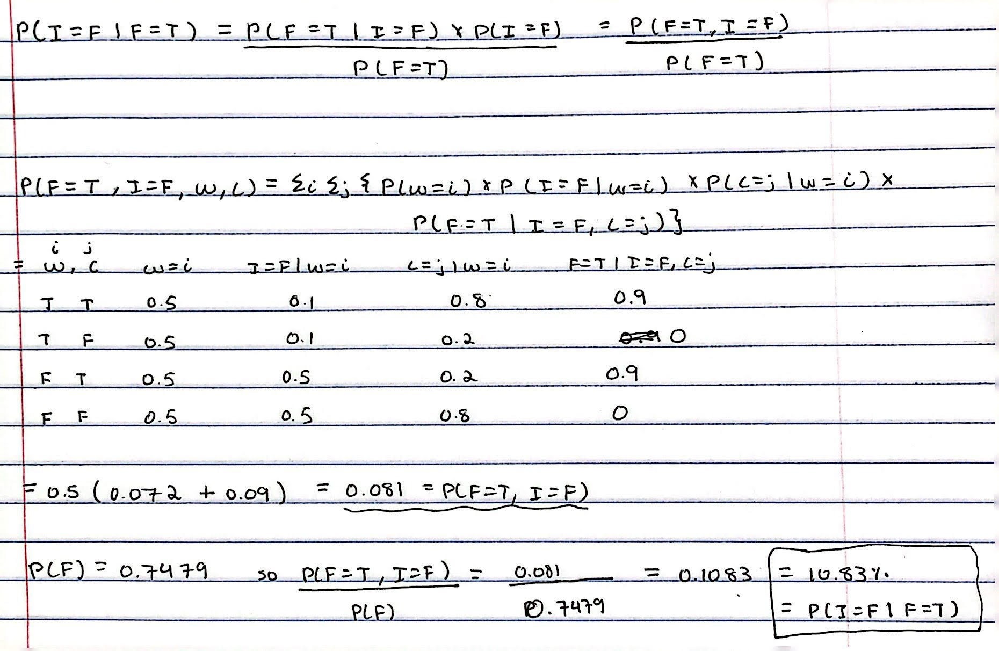

The manual calculations of the probability of someone not having influenza if they have a fever matches PyAgrum. The probability is low at 10.83% which makes sense as someone experiencing a fever is not likely to not have influenza. Also, the two calculated probabilities correctly add up to 100% (10.83+89.17).

## Exercise 2

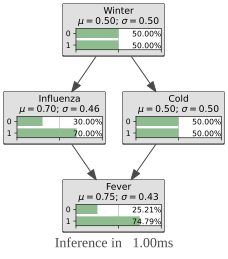

In [45]:
# no evidence
evidence = {}

# just to remind the BN
gnb.showInference(bn1, evs=evidence)

In [46]:
# Calculating the joint probability: Chain Rule
pICF = bn1.cpt('Influenza') * bn1.cpt('Cold') * bn1.cpt('Fever') * bn1.cpt('Winter')

# Marginalize Influenza
pICF = pICF.margSumOut(['Influenza'])
pICF.normalize()

(pyAgrum.Potential<double>@0x13c9167df90) 
             ||  Winter           |
Cold  |Fever ||0        |1        |
------|------||---------|---------|
0     |0     || 0.2200  | 0.0190  |
1     |0     || 0.0055  | 0.0076  |
0     |1     || 0.1800  | 0.0810  |
1     |1     || 0.0945  | 0.3924  |

#### PyAgrum Calculation of the joint probability of Fever, Cold, and Winter : P(Fever = T, Cold = T, Winter = T)

In [47]:
# the 1,1,1 in pICF corresponds to when Fever = True, Cold = True, Winter = True
print('P(Fever = T, Cold = T, Winter = T): %.4f%%' % (pICF[1,1,1] * 100))

P(Fever = T, Cold = T, Winter = T): 39.2400%


#### Manual Calculation

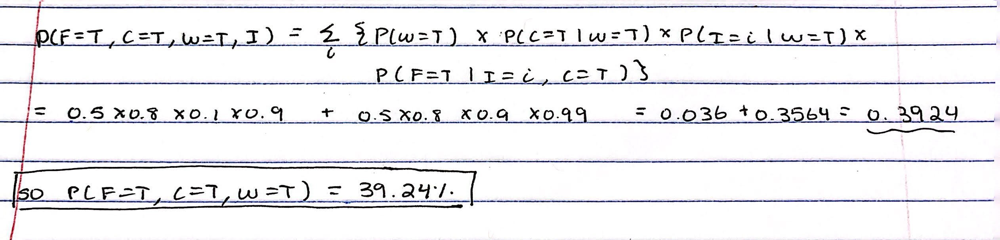

We calculated the joint probability of Fever, Cold, and Winter for the case that all three are true, and both PyAgrum and manual calculations produced the same result. The joint probability of someone having a fever and a cold in winter is 39.24%. 

## Exercise 3

The impact of having an incomplete CPT is that it makes probability calculations less accurate and less complete. For example, as susceptibility probabilities were only given for 3 age ranges, the joint probability of Gender and Suspectibilty will not be complete as the total probabilty of Age cannot be calculated. There should be entries for both male and female of all 10 age ranges. As there are 3 possible Suspectibilty values, the total number of entries should be 3\*2\*10 = 60.

## Exercise 4

The Diamond Princess (DP) cruise ship became famous due to the COVID-19 outbreak on the beginning of 2020. https://en.wikipedia.org/wiki/COVID-19_pandemic_on_Diamond_Princess

The data used in this exercise is shown below: 

In [48]:
# male, female
gender = [55, 45]

# stratified data from JIID's report, 2020: https://www.niid.go.jp/niid/en/2019-ncov-e/9417-covid-dp-fe-02.html
age = [16, 23, 347, 428, 334, 398, 923, 1015, 216, 11]
age_labels = ['0-9','10-19','20-29','30-39','40-49','50-59','60-69','70-79','80-89','90-99']

r_seed = 101

# for reproducibility
# must to run this before create the BN! 
# Even in the cases where were changed the states names
gum.initRandom(r_seed) 
random.seed(r_seed)

In [49]:
bn = gum.fastBN('Age{0-9|10-19|20-29|30-39|40-49|50-59|60-69|70-79|80-89|90-99}->Susceptibility{low|medium|high};' +
                'Gender{male|female}->Susceptibility;')


gnb.sideBySide(bn, gnb.getInference(bn, size='30'))

G <!-- Age --> Age Age <!-- Susceptibility --> Susceptibility Susceptibility <!-- Age->Susceptibility --> Age->Susceptibility <!-- Gender --> Gender Gender <!-- Gender->Susceptibility --> Gender->Susceptibility


#### Defining the CPTs

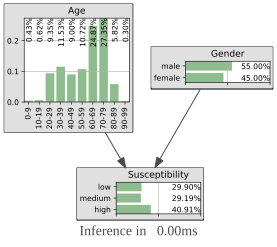

In [50]:
bn.cpt('Age')[:] = age / np.sum(age)
bn.cpt('Gender')[:] = gender / np.sum(gender)

# 0-9 yo, male: Susceptibility is 95% "low"
bn.cpt('Susceptibility')[{'Age':0, 'Gender':0}] = [.95, .05, .00]

# 0-9 yo, female: Susceptibility is 99% "low"
bn.cpt('Susceptibility')[{'Age':0, 'Gender':1}] = [.99, .01, .00]

# 90-99 yo, male: Susceptibility is 99% "high"
bn.cpt('Susceptibility')[{'Age':9, 'Gender':0}] = [.00, .01, .99]

# 90-99 yo, female: Susceptibility is 98% "high"
bn.cpt('Susceptibility')[{'Age':9, 'Gender':1}] = [.00, .02, .98]

# 40-49 yo, male: Susceptibility is 50% "high"
bn.cpt('Susceptibility')[{'Age':4, 'Gender':0}] = [.20, .30, .50]

# 40-49 yo, female: Susceptibility is 40% "medium"
bn.cpt('Susceptibility')[{'Age':4, 'Gender':1}] = [.30, .40, .30]

gnb.showInference(bn, size='30')

### Performing inference to get most likely Age given Gender = male, and Susceptibility = high

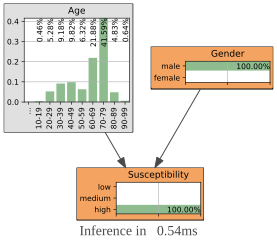

In [63]:
evidence = {'Gender':0, 'Susceptibility':'high'}

ie = gum.LazyPropagation(bn)

ie.setEvidence(evidence)
ie.makeInference()

gnb.showInference(bn, size='10', evs=evidence)

In [64]:
res_age = ie.posterior('Age')
res_age

(pyAgrum.Potential<double>@0x13c9167ded0) 
  Age                                                                                              |
0-9      |10-19    |20-29    |30-39    |40-49    |50-59    |60-69    |70-79    |80-89    |90-99    |
---------|---------|---------|---------|---------|---------|---------|---------|---------|---------|
 0.0000  | 0.0046  | 0.0528  | 0.0918  | 0.0982  | 0.0632  | 0.2188  | 0.4159  | 0.0483  | 0.0064  |

#### PyAgrum Calculation of the most likely age range with Gender = male, and Susceptibility = high

In [65]:
res_age_a = res_age.toarray()
max_idx = np.argmax(res_age_a)
max_perc = res_age_a[max_idx]*100
max_age = age_labels[max_idx]
print('With HIGH susceptibility and MALE gender, the age [%s] is the most likely with %.2f%%' % (max_age, max_perc))

With HIGH susceptibility and MALE gender, the age [70-79] is the most likely with 41.59%


#### Manual Calculation of the most likely age range with Gender = male, and Susceptibility = high
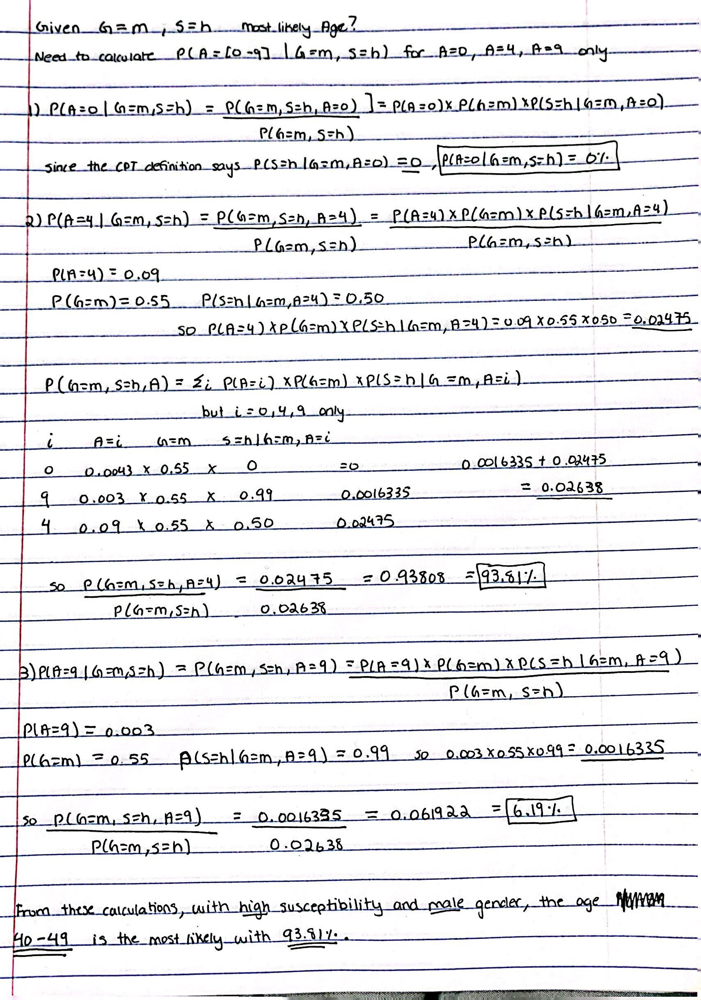

The manual calculation of the most likely age group given male gender and high susceptibility did not match PyAgrum. 

First, as not all entries of the susceptibility node were defined, we could only manually calculate P(A=i|G=m,S=h) for the 3 age groups defined (i = 0, i= 4, i=9). Therefore, not all age groups were considered unlike PyAgrum's calculation, and we found that age group 4 of 40-49 was the most likely with 93.81% while PyAgrum found 70-79 to be the most likely with 41.59%. 

As shown below, our calcuations for joint probabilities when all nodes were given matched PyAgrum, such as our calculation for  P(G=m,S=h,A=4)=0.02475 and P(G=m,S=h,A=9) = 0.0016335.
However, our calculation for P(G=m, S-h) was off by quite a bit. As shown below, after marginalizing Age, PyAgrum calculated P(G=m, S-h) to be 25.21%. However, since we could not marginalize Age completley as the CPT was not entirely defined, we calculated P(G=m, S-h) using only A=0,4,9 and got 2.64%. This large difference is one of the reasons why our results are not the same.

In [71]:
# Calculating the joint probability: Chain Rule
pICF3 = bn.cpt('Age') * bn.cpt('Gender') * bn.cpt('Susceptibility')

# the result are all the possible scenarios
pICF3

(pyAgrum.Potential<double>@0x13c9167b950) 
             ||  Gender           |
Age   |Suscep||male     |female   |
------|------||---------|---------|
0-9   |low   || 0.0023  | 0.0019  |
10-19 |low   || 0.0012  | 0.0013  |
20-29 |low   || 0.0169  | 0.0134  |
30-39 |low   || 0.0276  | 0.0203  |
40-49 |low   || 0.0099  | 0.0122  |
50-59 |low   || 0.0217  | 0.0115  |
[...18 more line(s) ...]
40-49 |high  || 0.0248  | 0.0122  |
50-59 |high  || 0.0159  | 0.0338  |
60-69 |high  || 0.0551  | 0.0371  |
70-79 |high  || 0.1048  | 0.0197  |
80-89 |high  || 0.0122  | 0.0099  |
90-99 |high  || 0.0016  | 0.0013  |

In [89]:
print('P(Susceptibility = high, Gender = male, Age = 4): %.4f' % (pICF3[2][4][0]))
print('P(Susceptibility = high, Gender = male, Age = 9): %.4f' % (pICF3[2][9][0]))

P(Susceptibility = high, Gender = male, Age = 4): 0.0248
P(Susceptibility = high, Gender = male, Age = 9): 0.0016


In [68]:
# In cases where Age is "unknown" we can marginalize that variable
pICF3 = pICF3.margSumOut(['Age'])
pICF3.normalize()

(pyAgrum.Potential<double>@0x13c9167e030) 
      ||  Gender           |
Suscep||male     |female   |
------||---------|---------|
low   || 0.1337  | 0.1653  |
medium|| 0.1642  | 0.1277  |
high  || 0.2521  | 0.1570  |

In [69]:
# P of S=h, G = m - P(G=m,S=h,A)
print('P(Susceptibility = high, Gender = male): %.4f%%' % (pICF3[2,0] * 100))

P(Susceptibility = high, Gender = male): 25.2055%


## Conclusion

After completing this lab we found that calculations by hand are yeilding very similar results to the PyAgrum calculations, except when we have a CPT that is not fully defined. All in all, PyAgrum is a great tool to work with Bayesian Networks as it does a lot of the tedious calculations for its users. 